In [65]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pylab as plt
from skimage import io

Since this .ipynb file has been created on google colab, images are loaded from internet urls.

In [66]:
urls = [
        'https://i.postimg.cc/xTYWqPvT/texture01.jpg',
        'https://i.postimg.cc/sDw0xCfw/texture02.png',
        'https://i.postimg.cc/YCCZzqD5/texture03.jpg',
        'https://i.postimg.cc/rFJ74tjG/texture04.jpg',
        'https://i.postimg.cc/tCXM94bs/texture05.jpg',
        'https://i.postimg.cc/5tZrJ59J/texture06.jpg',
        'https://i.postimg.cc/KYKWCp2Q/texture07.jpg',
        'https://i.postimg.cc/tTWM417x/texture08.jpg',
        'https://i.postimg.cc/9QgS85vr/texture09.jpg',
        'https://i.postimg.cc/L5S0YHZ0/texture10.jpg',
        'https://i.postimg.cc/mZ3nxFvx/texture11.jpg',
        'https://i.postimg.cc/4y12pr64/texture12.jpg'
]

This instruction, saves images in textures list.

In [67]:
textures = []

for url in urls:
    textures.append(cv2.cvtColor(io.imread(url), cv2.COLOR_BGR2RGB))

This function gets 2 input and normalize them in a way that element sum of each entry is equal to 1.

In [68]:
def normalize_weights(w1, w2):
    add = np.add(w1,w2)
    extra = add - np.ones(shape=w1.shape)
    return w1 - extra * (w1 / add), w2 - extra * (w2 / add)

Here we specify the box_size, overlap, and final_texture_size variable

In [69]:
box_size = 150
overlap = 30
final_texture_size = 2500

This function is gets two section as input and returns the DP and backtrace matrix of minimum boundry cut of these two sections.

In [70]:
def minimum_cost_path(section_1, section_2):
    rows, cols = section_1.shape[:2]
    DP = np.zeros((rows, cols), dtype=np.float32)
    difference_matrix = np.sum(np.abs(section_1 - section_2)**2, axis=2)
    DP[0, :] = difference_matrix[0, :]
    backtrace = np.zeros((rows, cols)) # 1:UP-LEFT  2:UP-CENTER 3:UP-RIGHT

    for row in range(rows):
        for col in range(cols):
            # Dynamic Programming
            possible_values = []

            if col == 0:
                possible_values = [1e5, DP[row-1, col], DP[row-1, col + 1]]
            elif col == cols - 1:
                possible_values = [DP[row-1, col - 1], DP[row-1, col], 1e5]
            else:
                possible_values = [DP[row-1, col - 1], DP[row-1, col], DP[row-1, col + 1]]

            DP[row, col] = min(possible_values)
            backtrace[row, col] = possible_values.index(DP[row, col]) + 1
            DP[row, col] += difference_matrix[row, col]

    return DP, backtrace

This function gets the return value of previous function and returns the path we have to traverse in ordere to get minimum boundry cost.

In [71]:
def backtrace_path(DP, backtrace, vetical=True):
    rows, cols = DP.shape
    row_index = rows - 1
    col_index = np.argmin(DP[row_index])
    path = []
    while row_index >= 0 :
        path.append((row_index, col_index) if vetical else (col_index, row_index))
        if backtrace[row_index, col_index] == 1:
            col_index -= 1
        elif backtrace[row_index, col_index] == 3:
            col_index += 1
        row_index -= 1
    
    return path[::-1]

This function basically controlls last two functions. also if our path is horizontal, this function handles it by transposing both sections and then returning (j, i) values instead of (i,j) so that we get the desired result.

In [72]:
def find_minimum_cost_path(section_1, section_2, vertical=True):
    DP, backtrace = minimum_cost_path(section_1, section_2) if vertical else\
                    minimum_cost_path(cv2.transpose(section_1),
                                      cv2.transpose(section_2))
    
    return backtrace_path(DP, backtrace, vertical)

These two functions create the overlap mask of our patch and large texture. the boundry path that has been found gets weight 0.5 for both sides and and on the sides one of them goes to zero while other one convergees to zero. this technique smoothens the blending of patches.

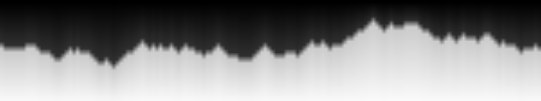
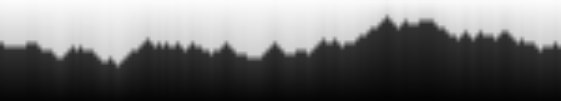

for the vertical one we get the almost same result but transpose.

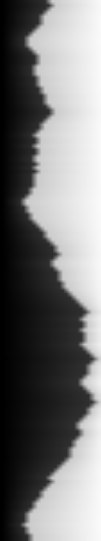
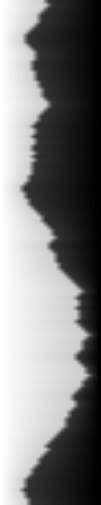

In [73]:
def create_blend_masks_horizontal(path, overlap_shape):
    rows, cols = overlap_shape
    mask_left = np.zeros((rows, cols))
    mask_right = np.ones((rows, cols))
    for row, col in path:
        mask_left[row, :col] = np.linspace(1, 0.8, num=col, endpoint=False)
        mask_left[row, col] = 0.5
        mask_left[row, col+1:] = np.linspace(0.2, 0, num=cols - col - 1, endpoint=True) 

    return mask_left, mask_right - mask_left

def create_blend_masks_vertical(path, overlap_shape):
    rows, cols = overlap_shape
    mask_up = np.zeros((rows, cols))
    mask_down = np.ones((rows, cols))
    for row, col in path:
        mask_up[:row, col] = np.linspace(1, 0.8, num=row, endpoint=False)
        mask_up[row, col] = 0.5
        mask_up[row+1:, col] = np.linspace(0.2, 0, num=rows - row-1, endpoint=True)  

    return mask_up, mask_down - mask_up

if we're not one the first column or first row, then we have two paths. this function blends two masks and makes them usable for other parts of the code.

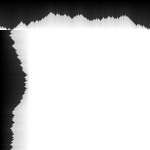

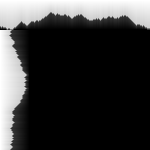

In [74]:
def handle_masks(current_row, current_col, large_texture, patch):
    path_v = []
    path_h = []
    mask_patch = np.ones((box_size, box_size), dtype=np.float32)
    mask_large_texture = np.zeros((box_size, box_size), dtype=np.float32)

    if current_row >= overlap:
        path_h = find_minimum_cost_path(large_texture[current_row: current_row + overlap, current_col: current_col + box_size],
                                        patch[:overlap, :],
                                        vertical=False)
    if current_col >= overlap:
        path_v = find_minimum_cost_path(large_texture[current_row: current_row + box_size, current_col: current_col + overlap],
                                        patch[:, :overlap],
                                        vertical=True)
    
    mask_left_right = create_blend_masks_horizontal(path_v, (box_size, overlap)) if current_col >= overlap else None
    mask_up_down = create_blend_masks_vertical(path_h, (overlap, box_size)) if current_row >= overlap else None

    if current_col >= overlap:
        mask_large_texture[:box_size, :overlap] = mask_left_right[0]
        mask_patch[:box_size, :overlap] = mask_left_right[1]

    if current_row >= overlap:
        mask_large_texture[:overlap, :box_size] = mask_up_down[0]
        mask_patch[:overlap, :box_size] = mask_up_down[1]

    return mask_patch, mask_large_texture

This function is almost the most important factor of this program. it captures the masks and patches from other function and merges the new patch with the parts of our large texture. The picture below shows this process more clearly.

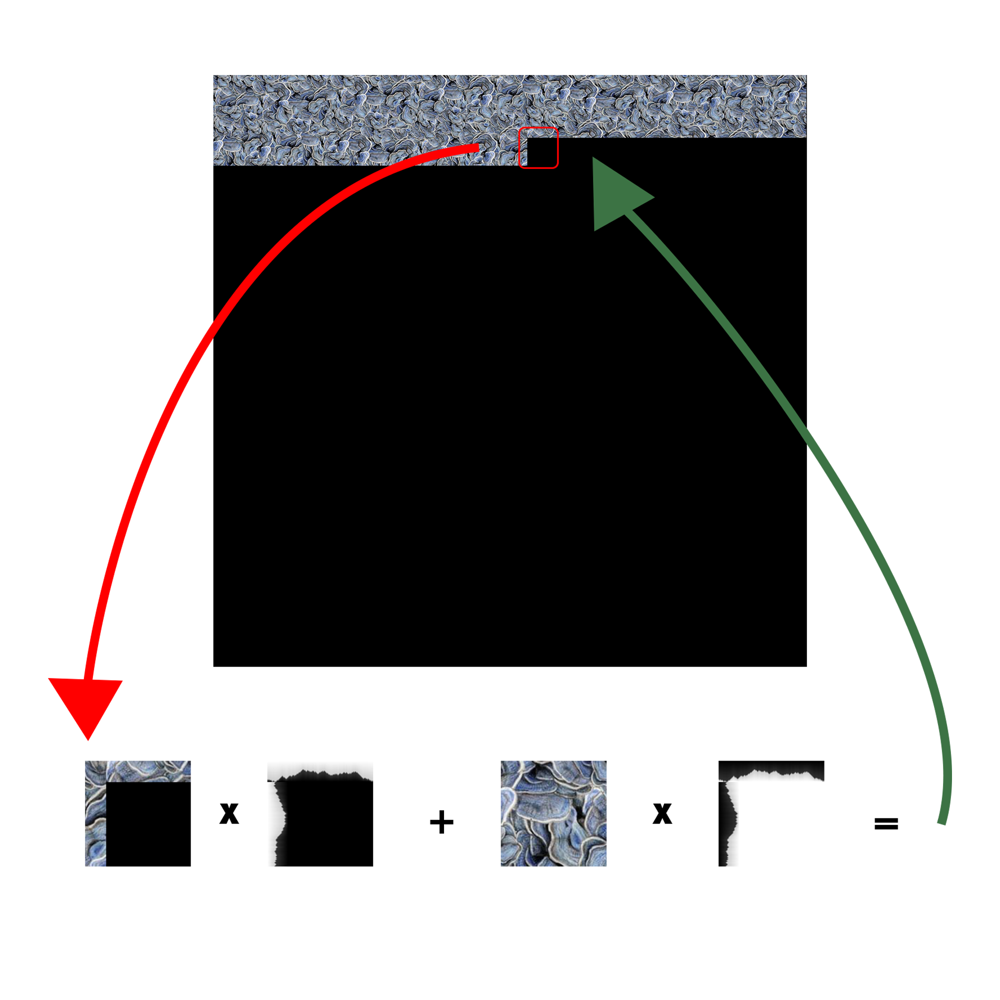

This method does the template matching logic using openCV library. Since not all algorithms supported mask feature for template matching, I used cv2.TM_CCORR_NORMED for this problem.

In [75]:
from numpy import random

def find_new_patch(current_row, current_col, large_texture, small_texture):
    mask = np.zeros((box_size, box_size, 3), dtype=np.uint8)
    template = np.zeros((box_size, box_size, 3), dtype=np.uint8)
    small_texture_gray = small_texture[:-int(box_size / 2), :-int(box_size / 2)]

    random_samples = 15
    if current_row > overlap:
        template[: overlap, :, :] = \
            large_texture[current_row: current_row + overlap, current_col: current_col + box_size, :]
        mask[: overlap, :, :] = 255

    if current_col > overlap:
        template[:, : + overlap, :] = \
            large_texture[current_row: current_row + box_size, current_col: current_col + overlap, :]
        mask[:, : overlap, :] = 255

    res = cv2.matchTemplate(small_texture_gray,
                            template,
                            cv2.TM_CCORR_NORMED,
                            mask=mask)


    ind = np.unravel_index(np.argsort(-res, axis=None), res.shape)
    random_choice = np.random.randint(random_samples)
    random_row, random_col = ind[0][random_choice], ind[1][random_choice]
    random_row, random_col = int(random_row + box_size / 2), int(random_col + box_size / 2)
    patch = small_texture[random_row: random_row + box_size, random_col: random_col + box_size]
    mask_patch, mask_large_texture = handle_masks(current_row, current_col, large_texture, patch)
    mask_p = np.zeros_like(patch, dtype=np.float32)
    mask_t = np.zeros_like(patch, dtype=np.float32)

    for i in range(3):
        mask_p[:, :, i] = mask_patch[:, :]
        mask_t[:, :, i] = mask_large_texture[:, :]

    image_patch = np.multiply(mask_p, patch, dtype=np.float32)
    image_texture = np.multiply(mask_t,
                                large_texture[current_row: current_row + box_size, current_col: current_col + box_size],
                                dtype=np.float32)

    return (image_patch + image_texture).astype(np.uint8)

And finally this method iterates over different rows and columns and gradually fills the large texture by calling the described methods. if we're at the begining of this process we have no prior texture to match our patch with that. Therefor we sample our first patch randomly and put it right at the begining of large texture.

In [76]:
def generate_texture(img):
    large_texture = np.zeros((final_texture_size + 200, final_texture_size + 200, 3), dtype=np.uint8)
    small_row, small_col = np.random.randint(min(img.shape[:2]) - box_size, size=2)
    large_row, large_col = 0, 0
    while large_row < final_texture_size:
        while large_col < final_texture_size:
            if large_row == 0 and large_col == 0:
                large_texture[:box_size, :box_size, :] = img[small_row: small_row + box_size, small_col: small_col + box_size, :]
                large_col += (box_size - overlap)
                continue
            large_texture[large_row:large_row + box_size, large_col:large_col + box_size, :] =\
                find_new_patch(large_row, large_col, large_texture, img)
            large_col += (box_size - overlap)
        large_col = 0
        large_row += (box_size - overlap)

        
    return large_texture

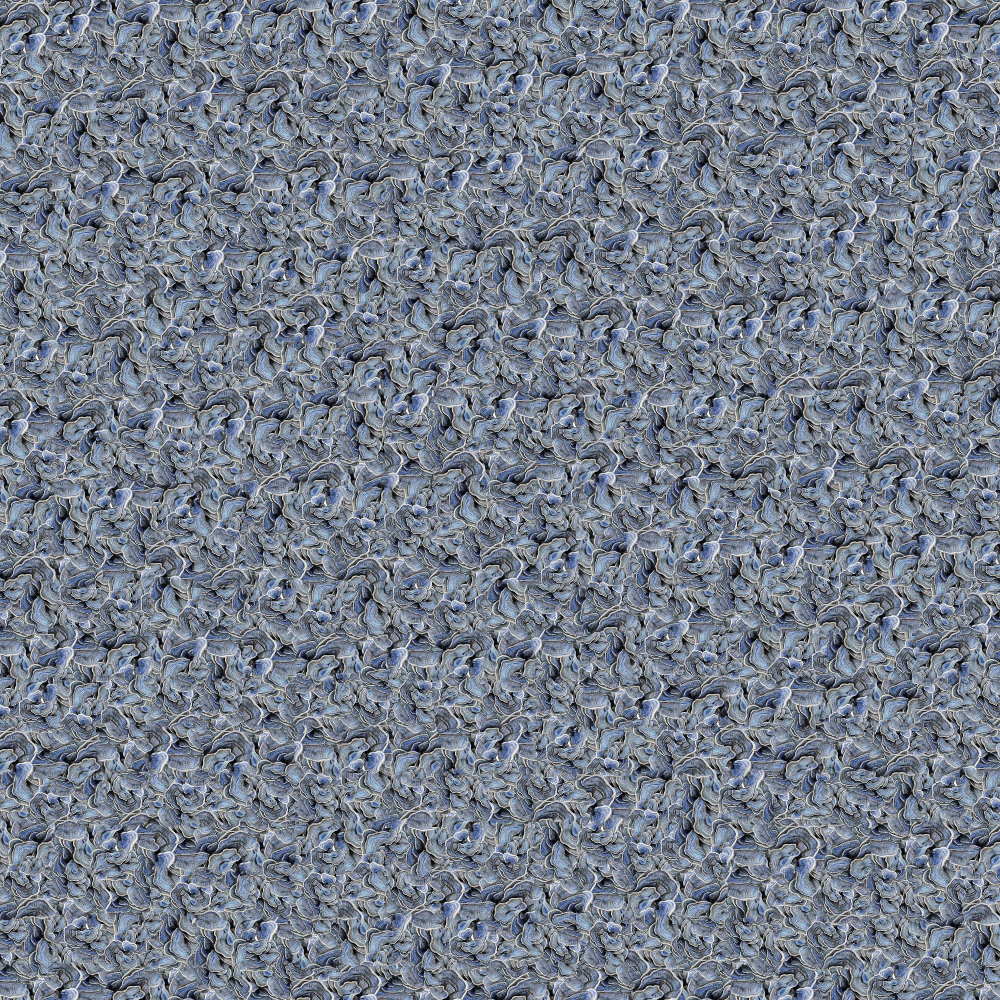

In [77]:
cv2_imshow(generate_texture(textures[10])[:2500, :2500])